# Decision Tree(Classifier)

In [1]:
# importing basic liberaries for data manuplulation and  visualization
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# liberaries for model building and data preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# to ignore future warnings
import warnings
warnings.filterwarnings('ignore')

# setting pareamters for graph
sns.set_theme(style='darkgrid')
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.dpi'] = 250
%matplotlib inline

In [2]:
# age:	     Age in years
# Gender:	 Gender ; Male --> 1, Female --> 0
# cp:	     Chest pain type
# trestbps:	 Resting blood pressure
# chol:	     cholesterol measure
# fbs:	     (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)
# restecg:	 "ecg observation at resting condition,   -- Value 0: normal
#         --  Value 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)
#         --  Value 2: showing probable or definite left ventricular hypertrophy by Estes' criteria"
# thalch:	  maximum heart rate achieved
# exang:	  exercise induced angina
# oldpeak:	  ST depression induced by exercise relative to rest
# slope:	  the slope of the peak exercise ST segment
# thal:	      Thal
# num:	      target [0=no heart disease; 1,2,3,4 = stages of heart disease ]

In [3]:
# reading data with pandas

df = pd.read_excel('heart_disease.xlsx', sheet_name='Heart_disease')
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,True,1.5,flat,fixed defect,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,Male,asymptomatic,125,0,False,normal,120,False,1.5,upsloping,reversable defect,4
904,62,Male,asymptomatic,166,170,False,st-t abnormality,120,True,3.0,flat,reversable defect,4
905,56,Male,non-anginal,170,0,False,lv hypertrophy,123,True,2.5,downsloping,normal,4
906,56,Male,non-anginal,144,208,True,st-t abnormality,105,TURE,NaN,downsloping,fixed defect,4


# CONTEXT

Cardiovascular diseases (CVDs) are the number 1 cause of death globally, taking an estimated 17.9 million lives each year, which accounts for 31% of all deaths worldwide. Four out of 5CVD deaths are due to heart attacks and strokes, and one-third of these deaths occur prematurely in people under 70 years of age. Heart failure is a common event caused by CVDs and this dataset contains 11 features that can be used to predict a possible heart disease.

People with cardiovascular disease or who are at high cardiovascular risk (due to the presence of one or more risk factors such as hypertension, diabetes, hyperlipidaemia or already established disease) need early detection and management wherein a machine learning model can be of great help

# UNDERSTANDING DATA

In [4]:
# renaming columns so that I can understand the data properly

df.rename(columns= {'age':'Age',
           'sex' : 'Sex',
           'cp' : 'ChestPainType',
           'trestbps' : 'RestingBP',
           'chol' : 'Cholesterol',
           'fbs' : 'FastingBS',
           'restecg' : 'RestingECG',
           'thalch' : 'MaxHR',
           'exang' : 'ExerciseAngina',
           'oldpeak' : 'Oldpeak',
           'slope' : 'ST_Slope',
           'thal' : 'thal',
           'num' : 'HeartDisease'}, inplace=True)
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,thal,HeartDisease
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,True,1.5,flat,fixed defect,0


In [5]:
# Age: age of the patient [years]
# Sex: sex of the patient
# ChestPainType: chest pain type 
# RestingBP: resting blood pressure [mm Hg]
# Cholesterol: serum cholesterol [mm/dl]
# FastingBS: fasting blood sugar 
# RestingECG: resting electrocardiogram results
# MaxHR: maximum heart rate achieved 
# ExerciseAngina: exercise-induced angina 
# Oldpeak: oldpeak = ST [Numeric value measured in depression]
# ST_Slope: the slope of the peak exercise ST segment
# thal: Thal
# HeartDisease: target [0=no heart disease; 1,2,3,4 = stages of heart disease ]

 descriptive analysis of numeric columns

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,908.0,53.791850,9.158031,29.0,47.75,54.0,60.0,77.0
RestingBP,908.0,133.430617,20.401608,0.0,120.00,130.0,144.0,200.0
Cholesterol,908.0,201.484581,112.097949,0.0,176.75,224.0,270.0,603.0
MaxHR,908.0,135.957048,26.804929,60.0,118.00,138.0,156.0,202.0
Oldpeak,846.0,0.891253,1.093875,-2.6,0.00,0.5,1.5,6.2
HeartDisease,908.0,1.008811,1.144436,0.0,0.00,1.0,2.0,4.0


In [7]:
# oldpeak column is having missing values
# age column is little bit skewed at the left side(left skewness)
# trestbps  is little bit skewed at the right side(right skewness)
# chol skewed at the left side(left skewness)
# thalch is little bit skewed at the left side(left skewness)
# oldpeak skewed at the right side(right skewness)
# num is a target column

<p style = "font-size : 50px; color : #393e46 ; font-family : 'Comic Sans MS'; text-align : center; background-color : #00adb5; border-radius: 50px 10px;"><strong>EDA</strong></p>

In [8]:
# Exploratory Data Analysis


# First Question should be why do we need this ??
# Out Come of this phase is as given below :

# Understanding the given dataset and helps clean up the given dataset.
# It gives you a clear picture of the features and the relationships between them.
# Providing guidelines for essential variables and leaving behind/removing non-essential variables.
# Handling Missing values or human error.
# Identifying outliers.
# EDA process would be maximizing insights of a dataset.
# This process is time-consuming but very effective

In [9]:
# numerical columns present in the table

num_col = df.describe().columns.tolist()
num_col

['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak', 'HeartDisease']

In [10]:
# unique values of each column 

for col in num_col:
    unique_val = df[col].unique()
    num_uni = len(unique_val)
    print(f'{col} is having {num_uni} unique values' )
    print(unique_val)
    print('--'*30)

Age is having 49 unique values
[63 41 57 52 66 56 48 53 30 54 37 46 68 76 58 42 64 71 69 45 44 39 62 50
 55 49 43 51 36 59 61 60 67 70 47 65 38 34 35 29 74 75 40 72 31 73 33 32
 77]
------------------------------------------------------------
RestingBP is having 85 unique values
[145 135 140 118 110 160 130 155 170 150 125 120 142 100 102 112 146 138
 134 122 136 108 115 104 128 106 156 129 124 126 132 105 152 148  94 180
 178 101 172  80 114 190 113 154 175 133 131 181 188 193 153 179 143  90
  96 163 161 196 107 167 174 158 192 185 144 169  95  92 200 127 121 166
 177 165 117 116 184  97 186 164 123 151   0 137 182]
------------------------------------------------------------
Cholesterol is having 228 unique values
[233 203 192 186 201 228 276 211 260 175 237 226 273 197 240 250 177 248
 265 303 149 234 160 264 242 302 278 220 294 394 214 219 271 213 245 196
 209 141 340 318 243 238 222 208 236 178 275 308 223 204 269 256 180 360
 239 235 262 257 295 417 212 254 283 244 315 306 342 2

descriptive analysis of Categorical columns

In [11]:
df.describe(include='object').T


,count,unique,top,freq
Sex,908,2,Male,718
ChestPainType,908,4,asymptomatic,495
RestingECG,908,3,normal,542
ExerciseAngina,908,4,False,516
ST_Slope,908,3,flat,453
thal,908,3,normal,386


In [12]:
# CATEGORICAL COLUMNS list

cat_columns = df.describe(include='object').columns.tolist()
cat_columns

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope', 'thal']

In [13]:
# checking datatypes

df.dtypes

Age                 int64
Sex                object
ChestPainType      object
RestingBP           int64
Cholesterol         int64
FastingBS            bool
RestingECG         object
MaxHR               int64
ExerciseAngina     object
Oldpeak           float64
ST_Slope           object
thal               object
HeartDisease        int64
dtype: object

In [14]:
# ExerciseAngina is not present in the correct format

I can see that ExerciseAngina values are not in proper format so I need to correct these values

In [15]:
# now checking unique values for another columns
for col in cat_columns:
    val_uni = df[col].unique()
    num_uniq = len(val_uni)
    print(f'col is having {num_uniq} unique values')
    print(val_uni)
    print('--'*30)

col is having 2 unique values
['Male' 'Female']
------------------------------------------------------------
col is having 4 unique values
['typical angina' 'atypical angina' 'asymptomatic' 'non-anginal']
------------------------------------------------------------
col is having 3 unique values
['lv hypertrophy' 'normal' 'st-t abnormality']
------------------------------------------------------------
col is having 4 unique values
[False True 'FALSE' 'TURE']
------------------------------------------------------------
col is having 3 unique values
['downsloping' 'flat' 'upsloping']
------------------------------------------------------------
col is having 3 unique values
['fixed defect' 'normal' 'reversable defect']
------------------------------------------------------------


In [16]:
# replaceing 'FALSE', 'TURE' with correct format False, True
df.ExerciseAngina.replace(['FALSE','TURE'], [False, True], inplace=True )

In [17]:
df.ExerciseAngina.unique()

array([False,  True])

now it is in correct format 

In [18]:
# checking datatypes
df.ExerciseAngina.dtypes

dtype('bool')

now it is correct

In [19]:
# check for null values
check_null = df.isna().sum()
check_null

Age                0
Sex                0
ChestPainType      0
RestingBP          0
Cholesterol        0
FastingBS          0
RestingECG         0
MaxHR              0
ExerciseAngina     0
Oldpeak           62
ST_Slope           0
thal               0
HeartDisease       0
dtype: int64

oldpeak column is having 62 null values

In [20]:
df.shape

(908, 13)

In [21]:
# percentage of missing values
print(check_null / df.shape[0] * 100)

Age               0.000000
Sex               0.000000
ChestPainType     0.000000
RestingBP         0.000000
Cholesterol       0.000000
FastingBS         0.000000
RestingECG        0.000000
MaxHR             0.000000
ExerciseAngina    0.000000
Oldpeak           6.828194
ST_Slope          0.000000
thal              0.000000
HeartDisease      0.000000
dtype: float64


In [22]:
# as I know that the data is small so I should no drop the rows
# so I am imputing missing values with median
df['Oldpeak'].fillna(df['Oldpeak'].median() , inplace=True)

In [23]:
df.isna().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
thal              0
HeartDisease      0
dtype: int64

In [24]:
# there is no missing values

In [25]:
# target column unique values

df.HeartDisease.unique()

array([0, 1, 2, 3, 4], dtype=int64)

In [26]:
# checking duplicated values
df.duplicated().sum()

1

In [27]:
# droping duplicated row
df.drop_duplicates(inplace=True)

In [28]:
# cross checking
df.duplicated().sum()

0

In [29]:
# Correlation Matrix
# Its necessary to remove correlated variables to improve your model.One can find correlations using pandas “.corr()” function and can visualize the correlation matrix using plotly express.
# Lighter shades represents positive correlation
# Darker shades represents negative correlation

In [30]:
# checking correlation between the columns

df.corr(numeric_only=True)

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,HeartDisease
Age,1.000000,0.253709,-0.100059,0.177004,-0.327868,0.192202,0.218461,0.326227
RestingBP,0.253709,1.000000,0.117392,0.112124,-0.132841,0.151086,0.135775,0.136581
Cholesterol,-0.100059,0.117392,1.000000,-0.113651,0.198074,-0.037256,0.032357,-0.239065
FastingBS,0.177004,0.112124,-0.113651,1.000000,-0.065827,0.028502,0.007703,0.156839
MaxHR,-0.327868,-0.132841,0.198074,-0.065827,1.000000,-0.348668,-0.113296,-0.322632
ExerciseAngina,0.192202,0.151086,-0.037256,0.028502,-0.348668,1.000000,0.357446,0.358837
Oldpeak,0.218461,0.135775,0.032357,0.007703,-0.113296,0.357446,1.000000,0.407175
HeartDisease,0.326227,0.136581,-0.239065,0.156839,-0.322632,0.358837,0.407175,1.000000


<p style = "font-size : 50px; color : #393e46 ; font-family : 'Comic Sans MS'; text-align : center; background-color : #00adb5; border-radius: 50px 10px;"><strong>FEATURE ENGINEERING</strong></p>

<Axes: >

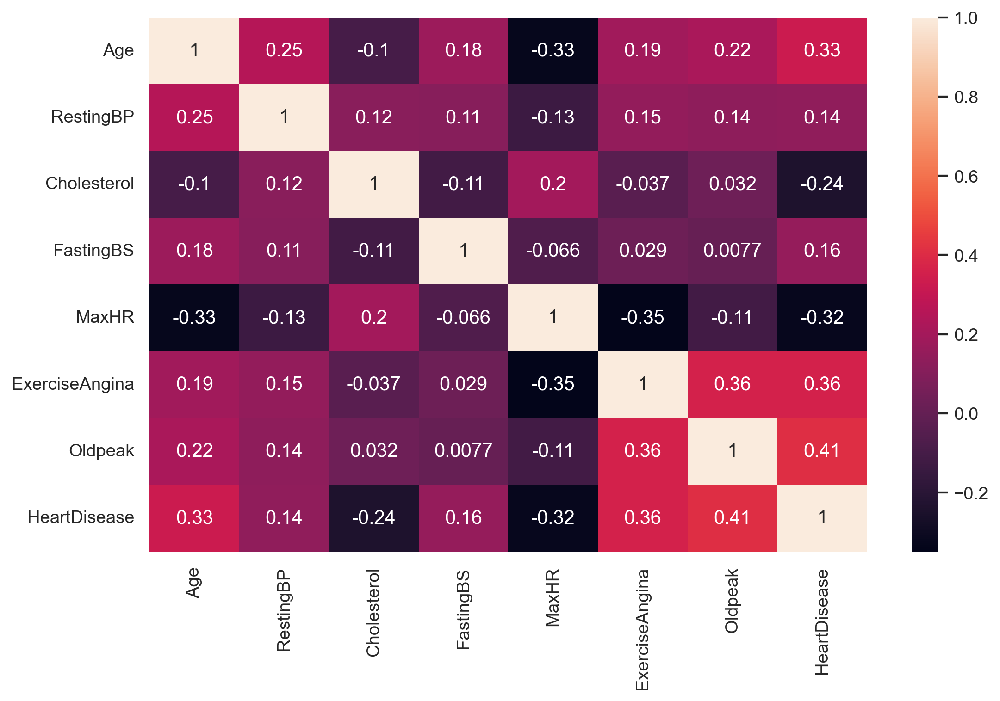

In [31]:
# finding relationship
sns.heatmap(df.corr(numeric_only=True), annot=True )

In [32]:
# I can see that MaxHR is highly negatively related to the target column
# somewhat negative correlation with "Cholesterol",
# whereas  there is poitive correatlation with "Oldpeak","FastingBS" and "RestingBP" columns

In [33]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,thal,HeartDisease
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,True,1.5,flat,fixed defect,0


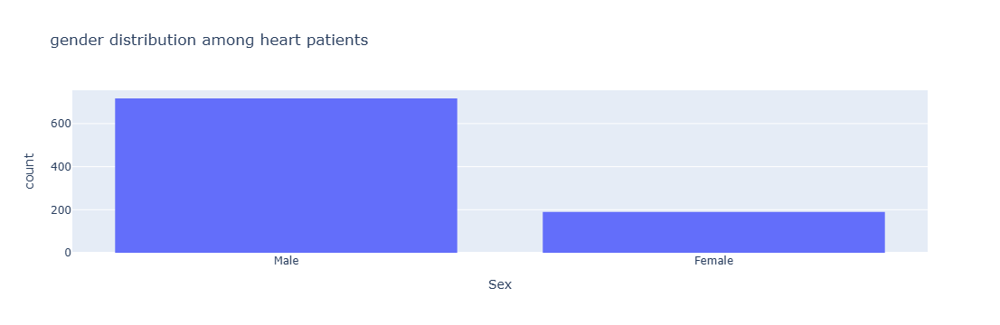

In [34]:
# ratio of male and female
px.histogram(data_frame=df, x='Sex', title='gender distribution among heart patients')

number of male are more than the number of females

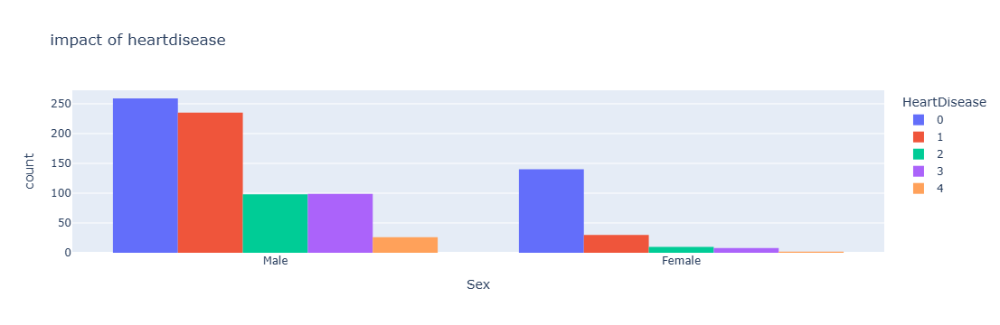

In [35]:
# findig relation between heartdisease with male and female
px.histogram(data_frame=df, x='Sex', color='HeartDisease', barmode='group',title='impact of heartdisease')

 can see that Male category is having high disease in coparision to female for each level

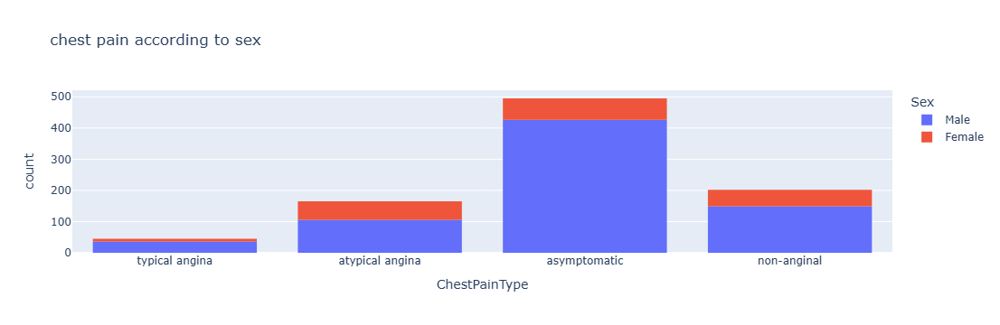

In [36]:
# Type of chest pain
px.histogram(data_frame=df, x='ChestPainType', color='Sex', title='chest pain according to sex')

number of male is high in each type of chest pain

In [37]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,thal,HeartDisease
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,False,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,False,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,False,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,False,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,True,1.5,flat,fixed defect,0


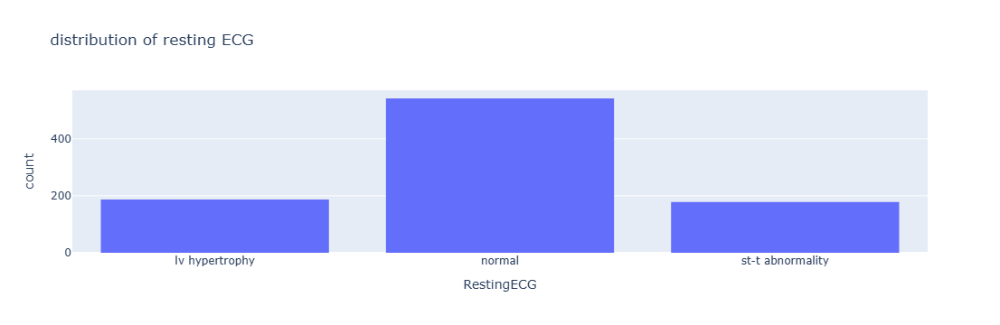

In [38]:
# distribution of resting ECG
px.histogram(data_frame=df, x='RestingECG', title='distribution of resting ECG')

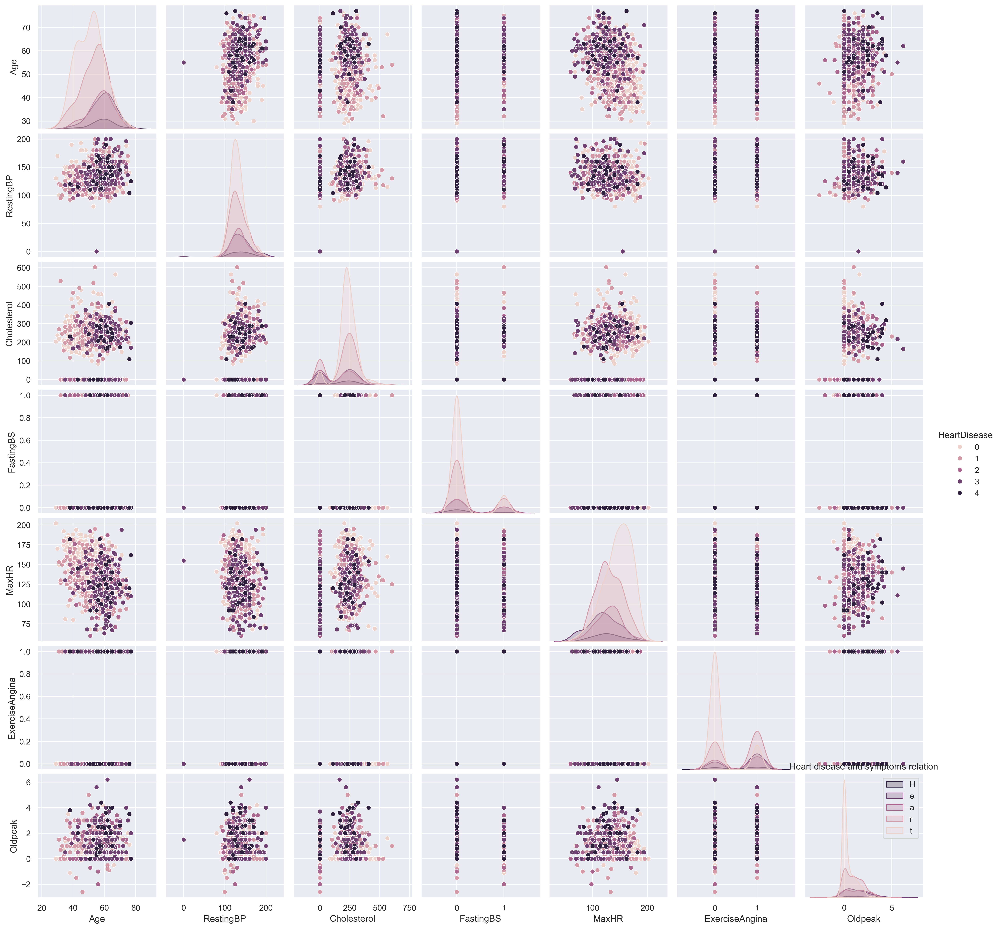

In [39]:
# pairplot for distribution of all columns
plt.rcParams['figure.dpi'] = 300
sns.pairplot(data=df, hue='HeartDisease')
plt.title('Heart disease and symptoms relation')
plt.legend('HeartDisease')

<Axes: >

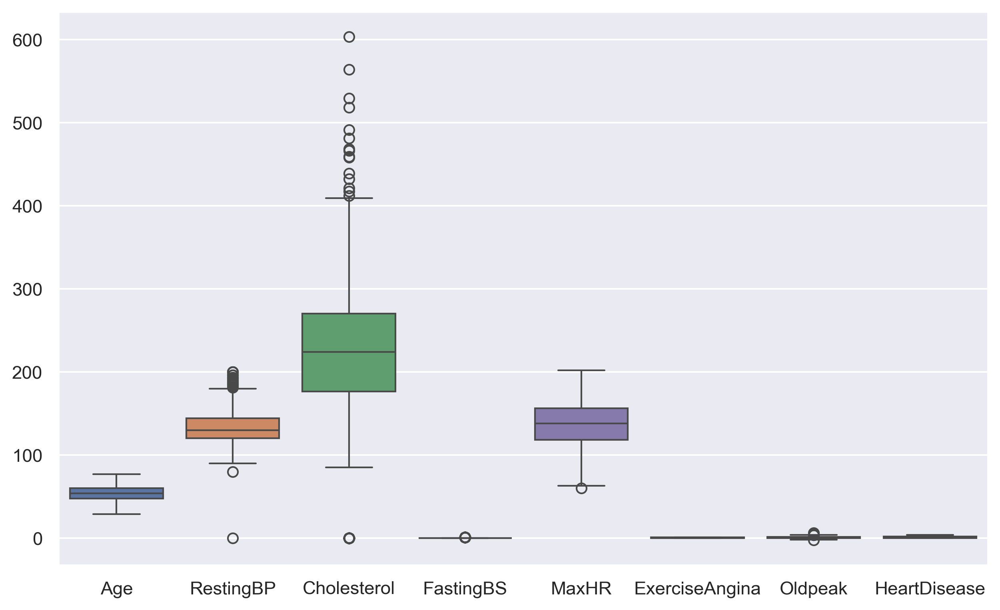

In [40]:
# outliers
sns.boxplot(df)

most of the columns are having outliers but in this case it is important to keep them as it is because these outliers are providing crucial information about the patients who are having extreme conditions/symptoms. If I cap them then this data will not provide me correct predictions about these patients

<p style = "font-size : 50px; color : #393e46 ; font-family : 'Comic Sans MS'; text-align : center; background-color : #00adb5; border-radius: 50px 10px;"><strong>DATA TRANSFORMATION</strong></p>

# ENCODING

In [41]:
# list of categorical columns

cat_columns

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope', 'thal']

In [42]:
# ONE HOT ENCODING

df = pd.get_dummies(data=df, columns=cat_columns, dtype=int)
df

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease,Sex_Female,Sex_Male,ChestPainType_asymptomatic,...,RestingECG_normal,RestingECG_st-t abnormality,ExerciseAngina_False,ExerciseAngina_True,ST_Slope_downsloping,ST_Slope_flat,ST_Slope_upsloping,thal_fixed defect,thal_normal,thal_reversable defect
0,63,145,233,True,150,2.3,0,0,1,0,...,0,0,1,0,1,0,0,1,0,0
1,41,135,203,False,132,0.0,0,0,1,0,...,1,0,1,0,0,1,0,1,0,0
2,57,140,192,False,148,0.4,0,0,1,1,...,1,0,1,0,0,1,0,1,0,0
3,52,118,186,False,190,0.0,0,0,1,0,...,0,0,1,0,0,1,0,1,0,0
4,57,110,201,False,126,1.5,0,0,1,1,...,1,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,125,0,False,120,1.5,4,0,1,1,...,1,0,1,0,0,0,1,0,0,1
904,62,166,170,False,120,3.0,4,0,1,1,...,0,1,0,1,0,1,0,0,0,1
905,56,170,0,False,123,2.5,4,0,1,0,...,0,0,0,1,1,0,0,0,1,0
906,56,144,208,True,105,0.5,4,0,1,0,...,0,1,0,1,1,0,0,1,0,0


<p style = "font-size : 50px; color : #393e46 ; font-family : 'Comic Sans MS'; text-align : center; background-color : #00adb5; border-radius: 50px 10px;"><strong>MODEL</strong></p>

In [43]:
df.head()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease,Sex_Female,Sex_Male,ChestPainType_asymptomatic,...,RestingECG_normal,RestingECG_st-t abnormality,ExerciseAngina_False,ExerciseAngina_True,ST_Slope_downsloping,ST_Slope_flat,ST_Slope_upsloping,thal_fixed defect,thal_normal,thal_reversable defect
0,63,145,233,True,150,2.3,0,0,1,0,...,0,0,1,0,1,0,0,1,0,0
1,41,135,203,False,132,0.0,0,0,1,0,...,1,0,1,0,0,1,0,1,0,0
2,57,140,192,False,148,0.4,0,0,1,1,...,1,0,1,0,0,1,0,1,0,0
3,52,118,186,False,190,0.0,0,0,1,0,...,0,0,1,0,0,1,0,1,0,0
4,57,110,201,False,126,1.5,0,0,1,1,...,1,0,0,1,0,1,0,1,0,0


### defining x and y variables

In [44]:
# independent features

x = df.drop(columns=['HeartDisease'])
x

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,Sex_Female,Sex_Male,ChestPainType_asymptomatic,ChestPainType_atypical angina,...,RestingECG_normal,RestingECG_st-t abnormality,ExerciseAngina_False,ExerciseAngina_True,ST_Slope_downsloping,ST_Slope_flat,ST_Slope_upsloping,thal_fixed defect,thal_normal,thal_reversable defect
0,63,145,233,True,150,2.3,0,1,0,0,...,0,0,1,0,1,0,0,1,0,0
1,41,135,203,False,132,0.0,0,1,0,1,...,1,0,1,0,0,1,0,1,0,0
2,57,140,192,False,148,0.4,0,1,1,0,...,1,0,1,0,0,1,0,1,0,0
3,52,118,186,False,190,0.0,0,1,0,0,...,0,0,1,0,0,1,0,1,0,0
4,57,110,201,False,126,1.5,0,1,1,0,...,1,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,125,0,False,120,1.5,0,1,1,0,...,1,0,1,0,0,0,1,0,0,1
904,62,166,170,False,120,3.0,0,1,1,0,...,0,1,0,1,0,1,0,0,0,1
905,56,170,0,False,123,2.5,0,1,0,0,...,0,0,0,1,1,0,0,0,1,0
906,56,144,208,True,105,0.5,0,1,0,0,...,0,1,0,1,1,0,0,1,0,0


In [45]:
# target column
y = df['HeartDisease']
y = pd.DataFrame(y, columns=['HeartDisease'])
y

,HeartDisease
0,0
1,0
2,0
3,0
4,0
...,...
903,4
904,4
905,4
906,4


In [46]:
# splitting data into taining and testing part

In [47]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y,train_size=0.20, random_state=42)

In [48]:
xtrain

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,Sex_Female,Sex_Male,ChestPainType_asymptomatic,ChestPainType_atypical angina,...,RestingECG_normal,RestingECG_st-t abnormality,ExerciseAngina_False,ExerciseAngina_True,ST_Slope_downsloping,ST_Slope_flat,ST_Slope_upsloping,thal_fixed defect,thal_normal,thal_reversable defect
866,71,130,221,False,115,0.0,0,1,1,0,...,0,1,0,1,0,1,0,0,1,0
577,45,130,219,False,130,1.0,0,1,1,0,...,0,1,0,1,0,1,0,0,0,1
85,71,160,302,False,162,0.4,1,0,0,1,...,1,0,1,0,0,0,1,0,1,0
242,48,100,187,False,100,0.0,0,1,0,1,...,1,0,1,0,1,0,0,0,1,0
698,65,135,254,False,127,2.8,0,1,1,0,...,0,0,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,63,135,252,False,172,0.0,1,0,0,0,...,0,0,1,0,0,0,1,0,1,0
270,37,120,260,False,130,0.0,1,0,0,1,...,1,0,1,0,1,0,0,1,0,0
861,55,172,260,False,73,2.0,0,1,1,0,...,1,0,1,0,1,0,0,0,1,0
435,57,154,232,False,164,0.0,0,1,0,1,...,0,0,1,0,0,0,1,0,1,0


In [49]:
ytrain

,HeartDisease
866,3
577,1
85,0
242,0
698,2
...,...
106,0
270,0
861,3
435,1


In [50]:
xtest

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,Sex_Female,Sex_Male,ChestPainType_asymptomatic,ChestPainType_atypical angina,...,RestingECG_normal,RestingECG_st-t abnormality,ExerciseAngina_False,ExerciseAngina_True,ST_Slope_downsloping,ST_Slope_flat,ST_Slope_upsloping,thal_fixed defect,thal_normal,thal_reversable defect
869,49,137,142,False,68,0.5,0,1,0,0,...,1,0,1,0,0,1,0,0,1,0
439,58,170,0,True,105,0.0,0,1,1,0,...,0,1,0,1,1,0,0,0,1,0
342,41,120,291,False,160,0.0,0,1,0,1,...,0,1,1,0,1,0,0,0,1,0
735,60,132,218,False,140,1.5,0,1,1,0,...,0,1,0,1,1,0,0,0,1,0
785,54,110,206,False,108,0.0,0,1,1,0,...,0,0,0,1,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619,53,126,0,False,106,0.0,0,1,1,0,...,1,0,1,0,1,0,0,0,1,0
842,55,0,0,False,155,1.5,0,1,0,0,...,1,0,1,0,0,1,0,0,0,1
645,46,120,231,False,115,0.0,0,1,1,0,...,1,0,0,1,1,0,0,0,0,1
766,69,184,236,True,131,0.5,0,1,1,0,...,1,0,0,1,0,1,0,0,1,0


In [51]:
ytest

,HeartDisease
869,3
439,1
342,0
735,2
785,3
...,...
619,1
842,3
645,1
766,2


# model building

In [52]:
dt = DecisionTreeClassifier(criterion='gini')
# model training
dt.fit(xtrain,  ytrain)

DecisionTreeClassifier()

In [53]:
# getting prediction
ypred = dt.predict(xtest)
ypred

array([0, 2, 0, 2, 2, 1, 0, 0, 3, 1, 2, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1,
       3, 1, 2, 1, 0, 1, 3, 0, 2, 0, 0, 0, 1, 2, 1, 1, 0, 3, 0, 0, 1, 3,
       2, 2, 0, 0, 0, 1, 0, 1, 0, 2, 0, 0, 2, 0, 3, 3, 3, 0, 1, 1, 0, 0,
       1, 2, 0, 0, 0, 1, 3, 3, 0, 1, 1, 0, 2, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 2, 0, 0, 1, 3, 2, 0, 0, 0, 0, 0, 0, 3, 0, 2, 3, 1, 1, 1,
       3, 0, 1, 1, 0, 2, 1, 1, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 3, 0, 1, 0, 2, 0, 0, 0, 0, 2, 2, 1, 1, 0, 4, 0, 2, 0, 0, 0,
       0, 1, 3, 0, 0, 0, 1, 0, 0, 2, 0, 2, 1, 4, 3, 1, 1, 1, 0, 0, 0, 0,
       2, 1, 0, 3, 1, 0, 0, 0, 0, 3, 2, 3, 1, 0, 2, 0, 0, 1, 1, 0, 3, 1,
       0, 3, 0, 0, 1, 3, 0, 3, 1, 1, 1, 0, 3, 2, 0, 2, 3, 3, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 3, 0, 0, 1, 0, 2, 1, 2, 0, 2, 2, 2, 3, 2, 0, 1, 2,
       0, 1, 0, 0, 2, 1, 0, 3, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 2, 0, 3,
       3, 0, 1, 0, 0, 1, 0, 1, 2, 1, 0, 0, 2, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       1, 2, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1,

# MODEL EVALUATION

In [54]:
# cheking overfitting
print('traing accuracy : ',dt.score(xtrain, ytrain))
print('testing accuracy : ', dt.score(xtest, ytest))

traing accuracy :  1.0
testing accuracy :  0.5206611570247934


# model is overfitted that means it is memorizing datapoints because it is giving 100% accuracy on training data but it is performimng worst(49% accuracy) at the new data(testing data)

In [55]:
# accuracy
accuracy_score(ytest, ypred)

0.5206611570247934

In [56]:
# precision, recall, f1-score, support, accuracy

print(classification_report(ytest, ypred))

              precision    recall  f1-score   support

           0       0.71      0.80      0.75       320
           1       0.46      0.39      0.42       213
           2       0.18      0.21      0.19        82
           3       0.24      0.21      0.22        87
           4       0.25      0.12      0.17        24

    accuracy                           0.52       726
   macro avg       0.37      0.35      0.35       726
weighted avg       0.50      0.52      0.51       726



In [57]:
# model accuracy is not good so I need to perform hyperpatrameter tunning

<p style = "font-size : 50px; color : #393e46 ; font-family : 'Comic Sans MS'; text-align : center; background-color : #00adb5; border-radius: 50px 10px;"><strong>HYPER PARAMETER TUNNING</strong></p>

In [58]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [59]:
# possible combination of parameters
params = {
    'criterion': ["gini", "entropy", "log_loss"],
    'splitter': ["best", "random"],
    'max_depth': [2,3,4,5,6,7,8,9,10,11]}

In [60]:
# gridsearchcv to find out best parameters

grid = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid=params, verbose=1)

In [61]:
# fitting it on training data
grid.fit(xtrain, ytrain)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
                         'splitter': ['best', 'random']},
             verbose=1)

In [62]:
# it has created 300 decision tree model by taking every single possible cobination of parameters that I have mentioned
# now it knows the best combination of patameters of my model

In [63]:
# asking it for giving me the best combination of parameters
print('the best patameters are :')
grid.best_params_

the best patameters are :


{'criterion': 'entropy', 'max_depth': 2, 'splitter': 'best'}

# FINAL MODLE

In [64]:
# model building and training

dt = DecisionTreeClassifier(criterion='entropy', max_depth=2, splitter='best')
dt.fit(xtrain, ytrain)

DecisionTreeClassifier(criterion='entropy', max_depth=2)

In [65]:
# getting predictions

dt.predict(xtest)

array([0, 2, 0, 2, 1, 0, 0, 0, 0, 1, 2, 1, 0, 1, 0, 2, 0, 0, 1, 1, 0, 1,
       0, 1, 2, 1, 0, 1, 2, 0, 2, 1, 0, 0, 0, 2, 2, 0, 0, 0, 1, 0, 0, 0,
       2, 0, 0, 0, 0, 1, 1, 1, 0, 2, 0, 0, 2, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 2, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 2, 1, 0, 2, 0, 1, 1, 2,
       2, 0, 1, 0, 0, 2, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 2, 0, 1, 0, 0, 2, 0, 2, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 2, 0, 0, 2, 2, 2, 1, 2, 1, 0, 0, 0, 0,
       2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 2, 2, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 2, 1, 1, 1, 2, 0, 1, 2, 0, 0, 0, 2, 1, 1, 0, 0,
       1, 1, 0, 0, 0, 2, 0, 0, 1, 0, 2, 1, 2, 0, 2, 1, 2, 1, 2, 0, 2, 2,
       1, 2, 0, 0, 2, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 2, 0, 1,
       2, 0, 2, 0, 2, 1, 0, 1, 2, 0, 0, 0, 2, 1, 0, 1, 0, 0, 2, 0, 2, 0,
       0, 1, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 1, 0, 1,

# MODEL EVALUATION

In [66]:
# checking overfitting, underfitting

print('training accuracy : ',dt.score(xtrain, ytrain))
print('testing accuracy : ', dt.score(xtest, ytest))

training accuracy :  0.6132596685082873
testing accuracy :  0.4931129476584022


In [69]:
#  precision, recall, f1-score, support, accuracy
print(classification_report(ytest, ypred))

              precision    recall  f1-score   support

           0       0.71      0.80      0.75       320
           1       0.46      0.39      0.42       213
           2       0.18      0.21      0.19        82
           3       0.24      0.21      0.22        87
           4       0.25      0.12      0.17        24

    accuracy                           0.52       726
   macro avg       0.37      0.35      0.35       726
weighted avg       0.50      0.52      0.51       726



In [67]:
# model is underfitted because I have insufficient data
# if I want to increase accuracy then I need to increase amount of data

[Text(0.5, 0.8333333333333334, 'ExerciseAngina_False <= 0.5\nentropy = 1.914\nsamples = 181\nvalue = [79, 52, 26, 20, 4]'),
 Text(0.25, 0.5, 'Oldpeak <= 2.25\nentropy = 1.426\nsamples = 96\nvalue = [66, 13, 9, 7, 1]'),
 Text(0.125, 0.16666666666666666, 'entropy = 1.138\nsamples = 87\nvalue = [66, 12, 5, 4, 0]'),
 Text(0.375, 0.16666666666666666, 'entropy = 1.753\nsamples = 9\nvalue = [0, 1, 4, 3, 1]'),
 Text(0.75, 0.5, 'Age <= 57.5\nentropy = 1.979\nsamples = 85\nvalue = [13.0, 39.0, 17.0, 13.0, 3.0]'),
 Text(0.625, 0.16666666666666666, 'entropy = 1.478\nsamples = 42\nvalue = [7.0, 27.0, 3.0, 5.0, 0.0]'),
 Text(0.875, 0.16666666666666666, 'entropy = 2.157\nsamples = 43\nvalue = [6.0, 12.0, 14.0, 8.0, 3.0]')]

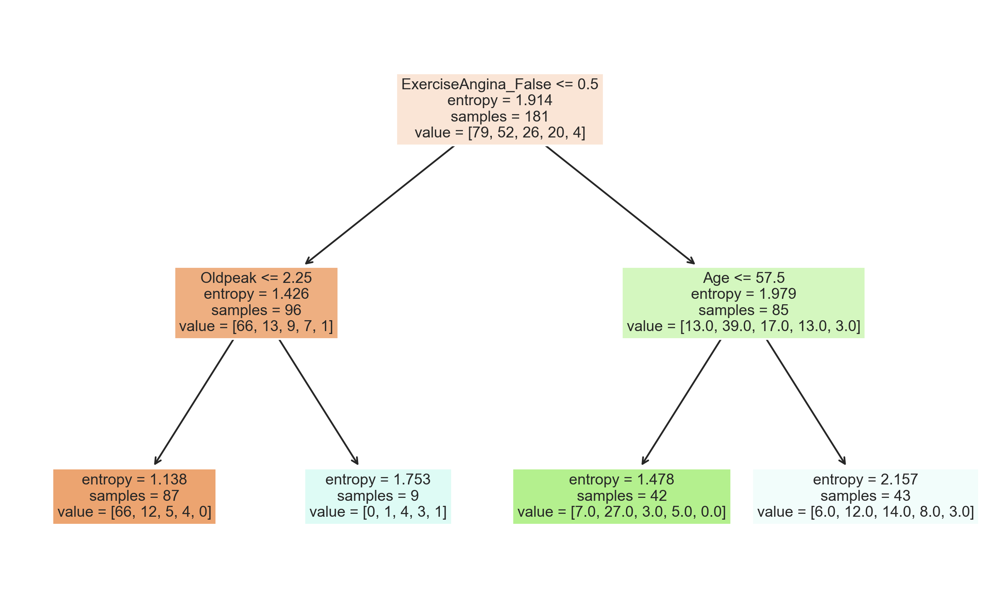

In [70]:
# MODEL VISUALIZATION
tree.plot_tree(dt, feature_names=df.columns, filled=True)